In [16]:
import pickle
import geopandas as gpd
from shapely.geometry import mapping
import rasterio
from rasterio.features import geometry_mask
import numpy as np
from PIL import Image

def extract_polygon_patch(polygon, image_data, src_transform):
    """Extract image patch within a polygon"""
    mask = geometry_mask([mapping(polygon)], transform=src_transform, invert=True, out_shape=(image_data.shape[1], image_data.shape[2]))
    masked_data = np.zeros_like(image_data[:3])
    for i in range(3):
        masked_data[i] = image_data[i] * mask
    bounds = polygon.bounds
    window = rasterio.windows.from_bounds(*bounds, transform=src_transform)
    row_off = int(window.row_off)
    col_off = int(window.col_off)
    height = int(window.height)
    width = int(window.width)
    patch = masked_data[:, row_off:row_off + height, col_off:col_off + width]
    patch = np.moveaxis(patch, 0, -1)
    patch = Image.fromarray(patch.astype(np.uint8))
    return patch

def process_shapefile(shapefile_path, tif_file_path):
    """Process shapefile to extract patches and labels"""
    polygons = gpd.read_file(shapefile_path)
    patches_and_labels = []
    with rasterio.open(tif_file_path) as src:
        image_data = src.read()

    for idx, row in polygons.iterrows():
        polygon = row.geometry
        label = row['label']
        patch = extract_polygon_patch(polygon, image_data, src.transform)
        patches_and_labels.append((np.array(patch), label))
        
    return patches_and_labels


In [17]:
# Example usage
shapefile_path = 'h:\\Yehmh\\DNDF\\202404_DNDF\\transects_seg_labeled\\transects_seg_species6.shp'
tif_file_path = 'h:\\Yehmh\\DNDF\\202404_DNDF\\DNDF_merge.tif'
pickle_file_path = 'h:\\Yehmh\\DNDF\\202404_DNDF\\pickles\\transects_seg_species6_patches_and_labels_2.pkl'

# Process and save patches_and_labels to a pickle file
patches_and_labels = process_shapefile(shapefile_path, tif_file_path)
with open(pickle_file_path, 'wb') as f:
    pickle.dump(patches_and_labels, f)

print("patches_and_labels saved to patches_and_labels.pkl")

patches_and_labels saved to patches_and_labels.pkl


In [2]:
# slow... 快的放在 label_seg_with_treepoints.ipynb，但還沒成功

import pickle
import geopandas as gpd
from shapely.geometry import mapping
import rasterio
from rasterio.features import geometry_mask
import numpy as np
from PIL import Image

def extract_polygon_patch(polygon, image_data, src_transform):
    """Extract image patch within a polygon"""
    mask = geometry_mask([mapping(polygon)], transform=src_transform, invert=True, out_shape=(image_data.shape[1], image_data.shape[2]))
    masked_data = np.zeros_like(image_data[:3])
    for i in range(3):
        masked_data[i] = image_data[i] * mask
    bounds = polygon.bounds
    window = rasterio.windows.from_bounds(*bounds, transform=src_transform)
    row_off = int(window.row_off)
    col_off = int(window.col_off)
    height = int(window.height)
    width = int(window.width)
    patch = masked_data[:, row_off:row_off + height, col_off:col_off + width]
    patch = np.moveaxis(patch, 0, -1)
    patch = Image.fromarray(patch.astype(np.uint8))
    return patch

def process_shapefile(shapefile_path, tif_file_path):
    """Process shapefile to extract patches, labels, and FIDs"""
    polygons = gpd.read_file(shapefile_path)
    patches_and_labels = []
    
    with rasterio.open(tif_file_path) as src:
        image_data = src.read()

    for idx, row in polygons.iterrows():
        polygon = row.geometry
        label = row['label']
        fid = int(row['FID'])  # Extract FID value
        transect = int(row['transect'])
        ID = f"{transect}_{fid}"
        print(label, fid, ID)
        patch = extract_polygon_patch(polygon, image_data, src.transform)
        patches_and_labels.append((np.array(patch), label, ID))  # Store patch, label, and FID
        
    return patches_and_labels

# Example usage
shapefile_path = 'h:\\Yehmh\\DNDF\\202404_DNDF\\transects_seg_labeled\\transects_seg_species6.shp'
tif_file_path = 'h:\\Yehmh\\DNDF\\202404_DNDF\\DNDF_merge.tif'
pickle_file_path = 'h:\\Yehmh\\DNDF\\202404_DNDF\\pickles\\transects_seg_species6_patches_and_labels_4.pkl'

# Process and save patches_and_labels to a pickle file
patches_and_labels = process_shapefile(shapefile_path, tif_file_path)
with open(pickle_file_path, 'wb') as f:
    pickle.dump(patches_and_labels, f)

print("patches_and_labels saved to patches_and_labels.pkl")


Liqu_fo 0 101_0
Frax_gr 2 101_2
Bisc_ja 6 101_6
Liqu_fo 13 101_13
Frax_gr 14 101_14
Bisc_ja 15 101_15
Bisc_ja 18 101_18
Frax_gr 42 101_42
Frax_gr 43 101_43
Bisc_ja 44 101_44
Frax_gr 48 101_48
Frax_gr 52 101_52
Bisc_ja 59 101_59
Frax_gr 65 101_65
Cinn_bu 67 101_67
Liqu_fo 73 101_73
Frax_gr 78 101_78
Frax_gr 95 101_95
Bisc_ja 109 101_109
Bisc_ja 116 101_116
Frax_gr 120 101_120
Frax_gr 122 101_122
Liqu_fo 130 101_130
Frax_gr 141 101_141
Liqu_fo 152 101_152
Bisc_ja 154 101_154
Frax_gr 156 101_156
Bisc_ja 163 101_163
Frax_gr 170 101_170
Liqu_fo 171 101_171
Frax_gr 173 101_173
Bisc_ja 177 101_177
Frax_gr 183 101_183
Bisc_ja 188 101_188
Liqu_fo 7 112_7
Liqu_fo 23 112_23
Cinn_bu 26 112_26
Liqu_fo 27 112_27
Liqu_fo 34 112_34
Liqu_fo 36 112_36
Zelk_se 38 112_38
Liqu_fo 46 112_46
Cinn_bu 50 112_50
Cinn_bu 51 112_51
Liqu_fo 61 112_61
Cinn_bu 62 112_62
Zelk_se 66 112_66
Cinn_bu 69 112_69
Zelk_se 70 112_70
Cinn_bu 78 112_78
Cinn_bu 83 112_83
Liqu_fo 85 112_85
Liqu_fo 92 112_92
Bisc_ja 96 112_96
Cinn

In [ ]:
# fast but no information in the output

import pickle
import geopandas as gpd
from shapely.geometry import mapping
import rasterio
from rasterio.features import geometry_mask
import numpy as np
from PIL import Image

def extract_polygon_patch(polygon, src, src_transform):
    """Extract image patch within a polygon using windowed reading."""
    bounds = polygon.bounds
    window = rasterio.windows.from_bounds(*bounds, transform=src_transform)
    
    # Read only the necessary window from the TIFF file
    with rasterio.open(src) as src:
        image_data = src.read(window=window)

    # Create a mask for the polygon using the bounds of the window
    mask = geometry_mask([mapping(polygon)], transform=src_transform, invert=True, out_shape=image_data.shape[1:])

    # Apply the mask to the image data
    masked_data = image_data * mask.astype(image_data.dtype)

    # Move channels to the last axis
    patch = np.moveaxis(masked_data, 0, -1)
    
    return Image.fromarray(patch.astype(np.uint8))

def process_shapefile(shapefile_path, tif_file_path):
    """Process shapefile to extract patches, labels, and FIDs."""
    polygons = gpd.read_file(shapefile_path)
    patches_and_labels = []
    
    with rasterio.open(tif_file_path) as src:
        src_transform = src.transform

    for idx, row in polygons.iterrows():
        polygon = row.geometry
        label = row['label']
        fid = int(row['FID'])  # Extract FID value
        transect = int(row['transect'])
        ID = f"{transect}_{fid}"
        print(label, fid, ID)
        
        patch = extract_polygon_patch(polygon, tif_file_path, src_transform)
        patches_and_labels.append((np.array(patch), label, ID))  # Store patch, label, and FID
        
    return patches_and_labels

# Example usage
shapefile_path = 'h:\\Yehmh\\DNDF\\202404_DNDF\\transects_seg_labeled\\transects_seg_species6.shp'
tif_file_path = 'h:\\Yehmh\\DNDF\\202404_DNDF\\DNDF_merge.tif'
pickle_file_path = 'h:\\Yehmh\\DNDF\\202404_DNDF\\pickles\\transects_seg_species6_patches_and_labels_4.pkl'

# Process and save patches_and_labels to a pickle file
patches_and_labels = process_shapefile(shapefile_path, tif_file_path)
with open(pickle_file_path, 'wb') as f:
    pickle.dump(patches_and_labels, f)

print("patches_and_labels saved to patches_and_labels.pkl")


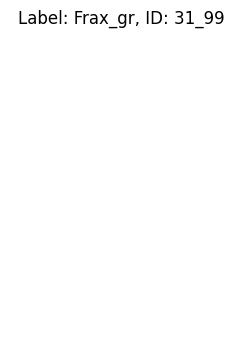

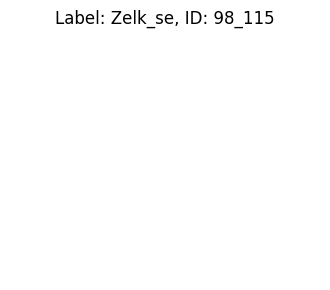

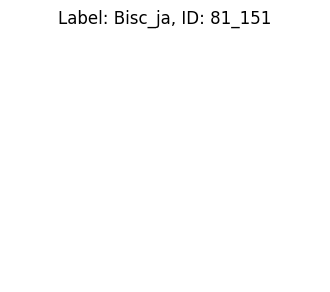

In [1]:
import pickle
import random
from PIL import Image
import matplotlib.pyplot as plt

# Load the pickle file
with open('h:\\Yehmh\\DNDF\\202404_DNDF\\pickles\\transects_seg_species6_patches_and_labels_4.pkl', 'rb') as f:
    patches_and_labels = pickle.load(f)

# Randomly select 3 entries from the list
sampled_entries = random.sample(patches_and_labels, 3)

# Display the images along with their labels and FIDs
for i, (patch, label, ID) in enumerate(sampled_entries):
    plt.figure(figsize=(4, 4))
    plt.imshow(Image.fromarray(patch))  # Convert numpy array to image for display
    plt.title(f'Label: {label}, ID: {ID}')
    plt.axis('off')
    plt.show()


c:\Users\user\.conda\envs\RS\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\user\.conda\envs\RS\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/10], Loss: 1.8955
Epoch [2/10], Loss: 1.4983
Epoch [3/10], Loss: 1.4353
Epoch [4/10], Loss: 1.3942
Epoch [5/10], Loss: 1.3503
Epoch [6/10], Loss: 1.2293
Epoch [7/10], Loss: 1.2396
Epoch [8/10], Loss: 1.2445
Epoch [9/10], Loss: 1.1837
Epoch [10/10], Loss: 1.2243


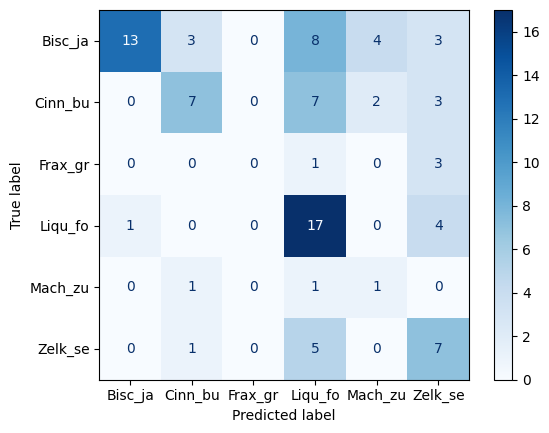

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


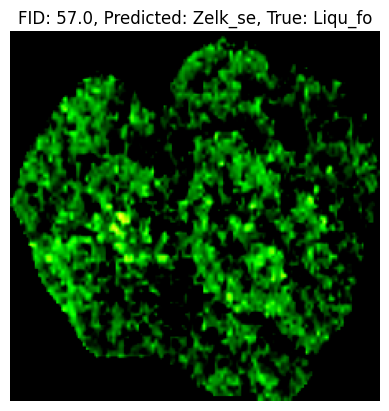

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


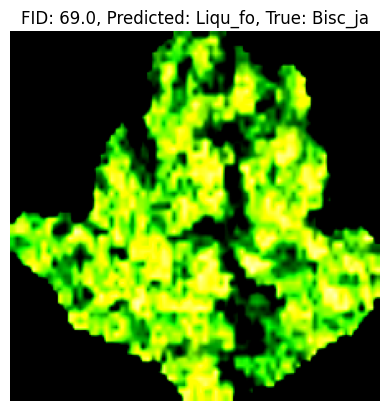

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


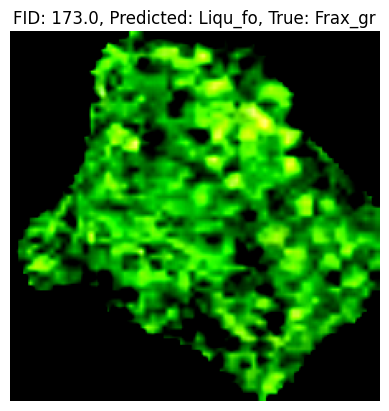

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


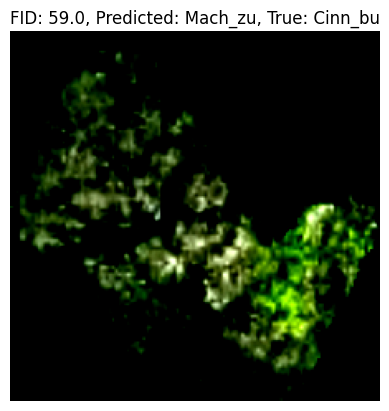

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


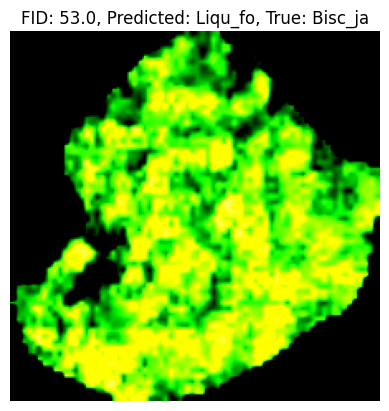

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


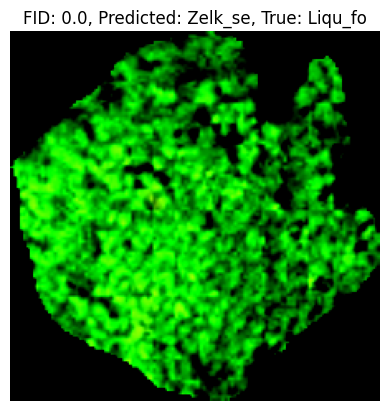

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


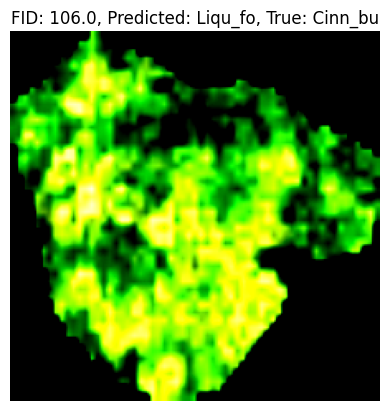

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


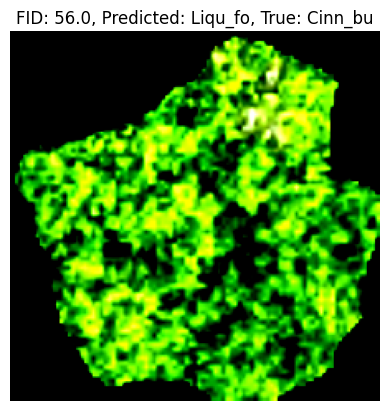

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


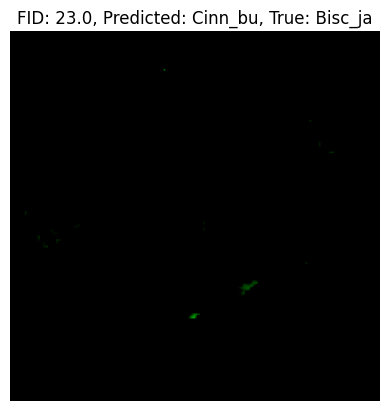

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


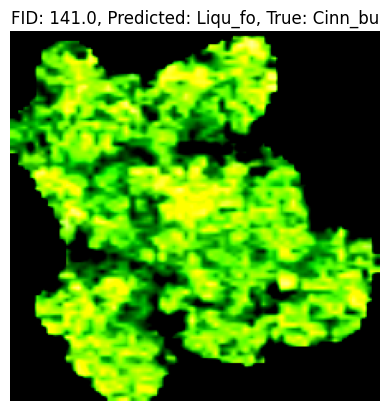

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


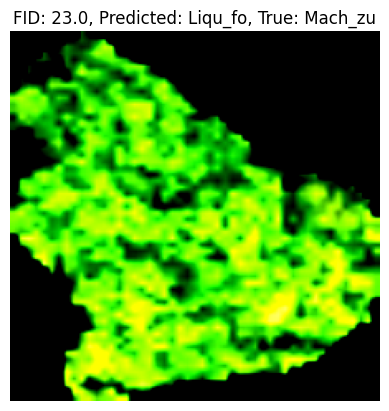

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


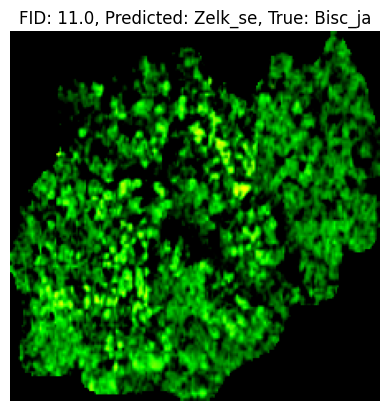

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


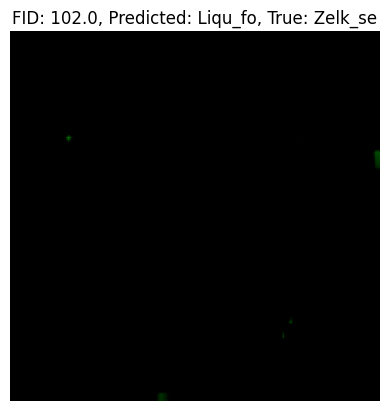

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


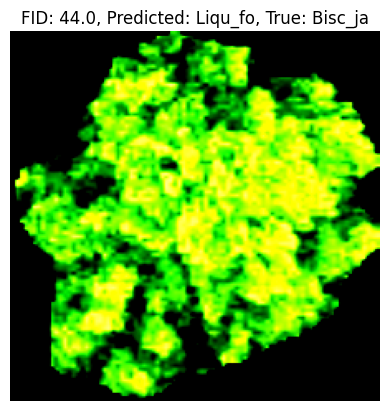

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


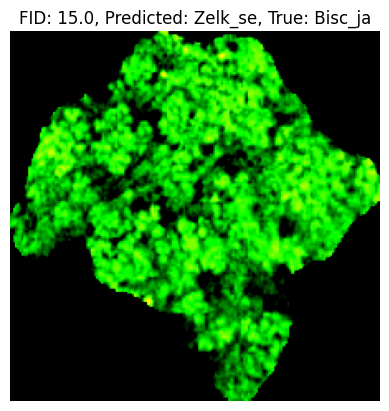

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


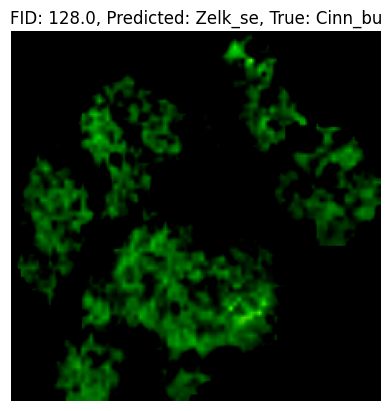

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


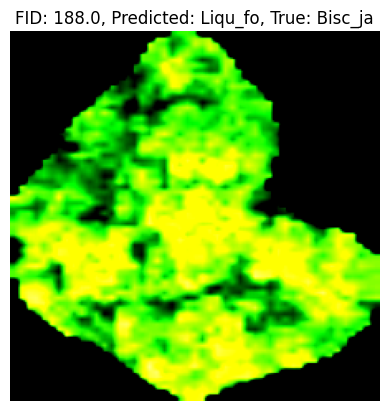

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


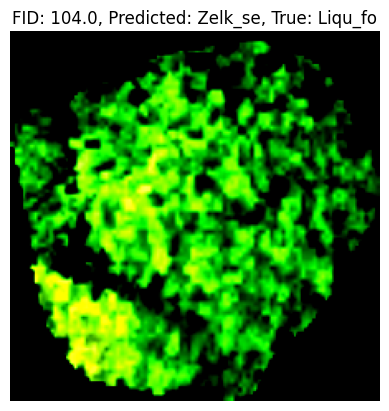

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


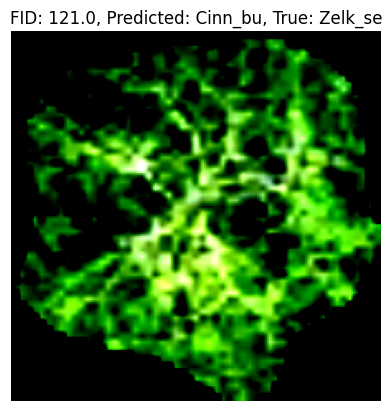

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


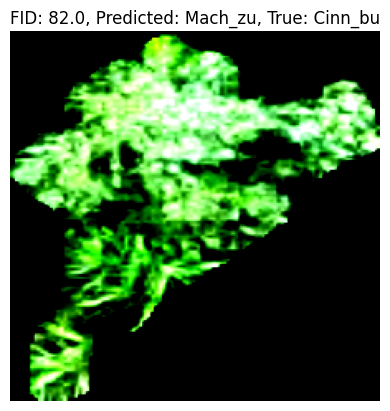

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


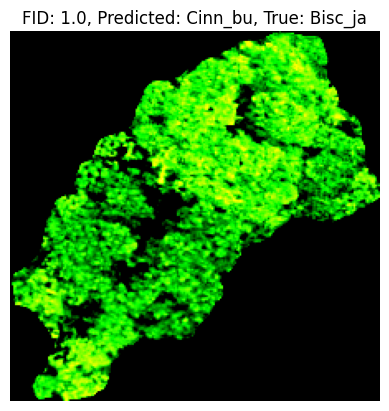

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


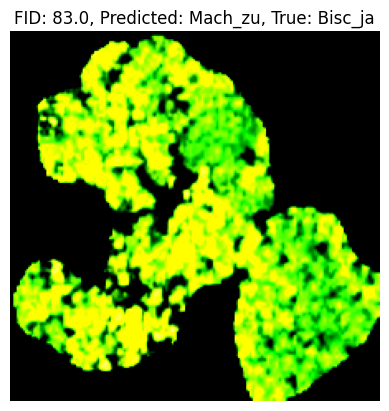

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


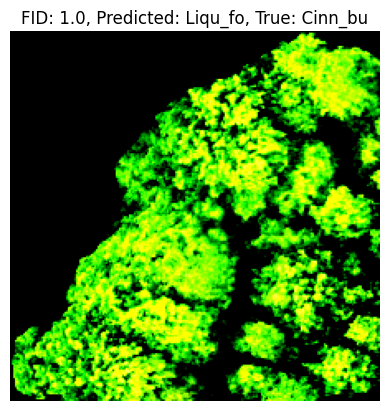

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


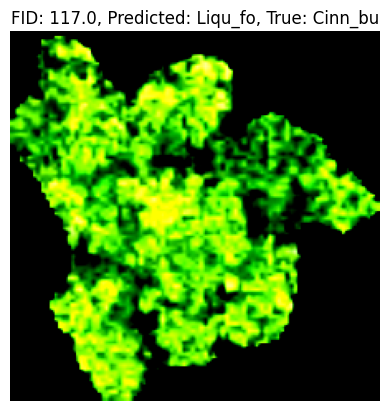

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


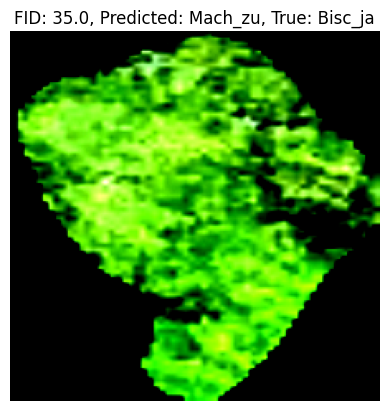

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


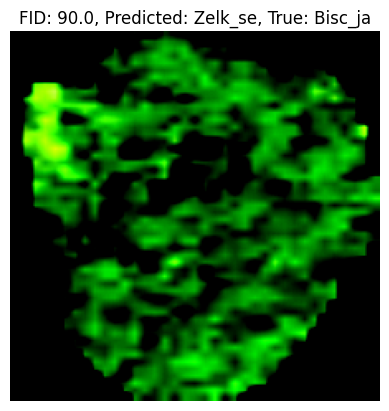

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


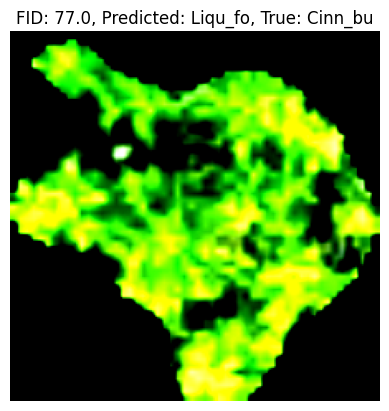

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


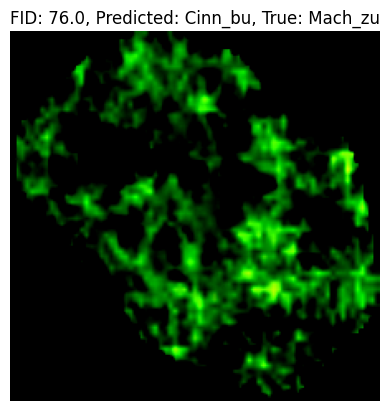

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


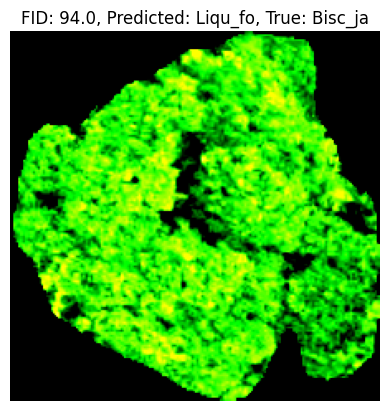

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


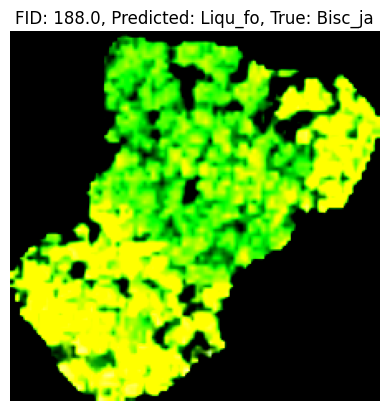

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


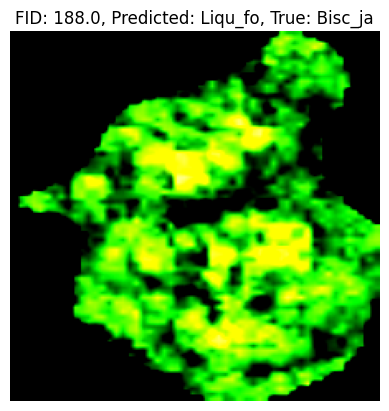

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


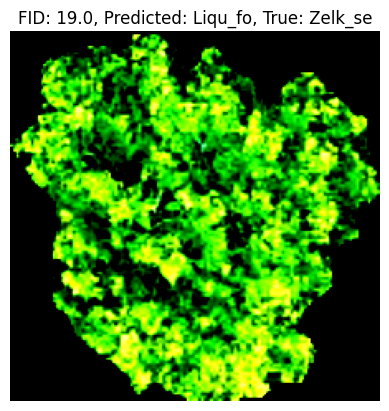

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


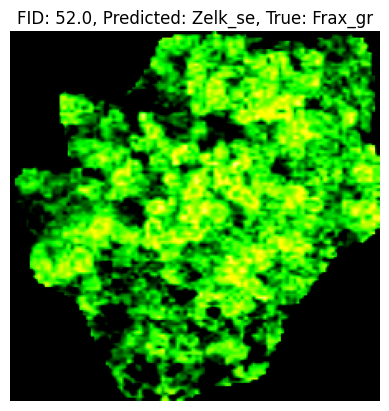

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


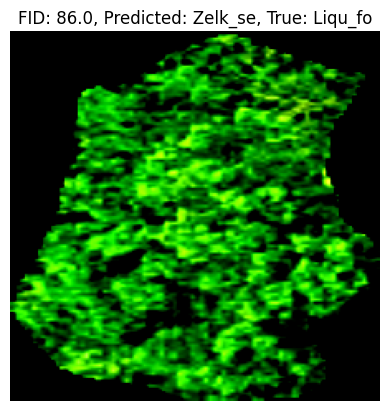

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


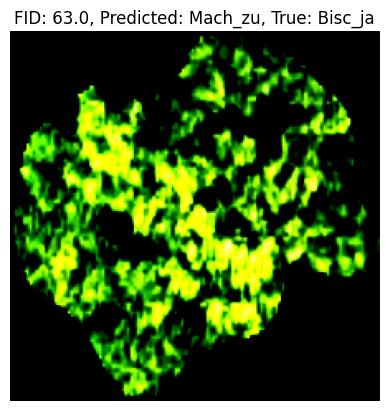

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


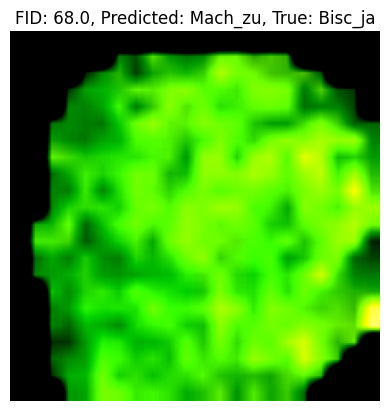

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


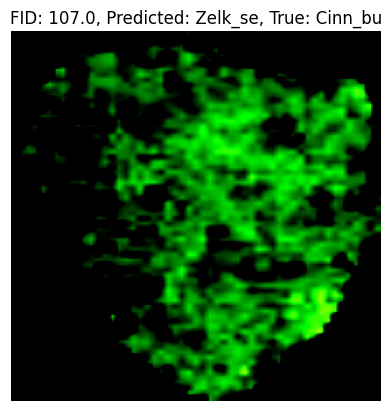

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


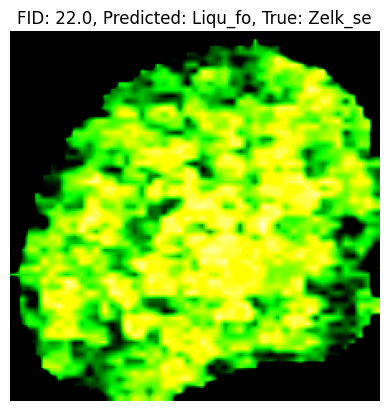

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


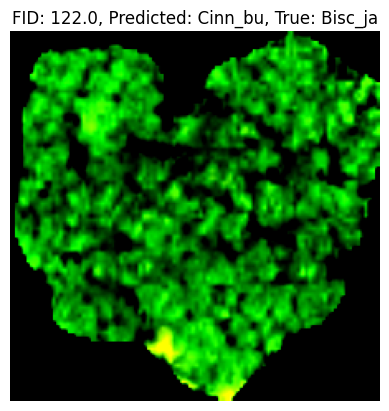

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


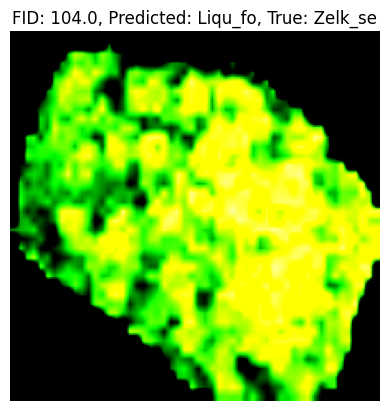

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


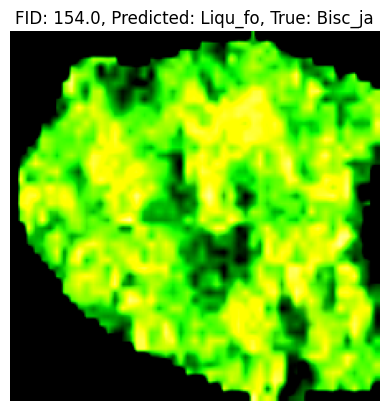

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


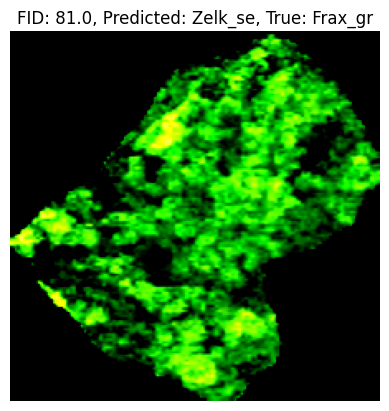

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


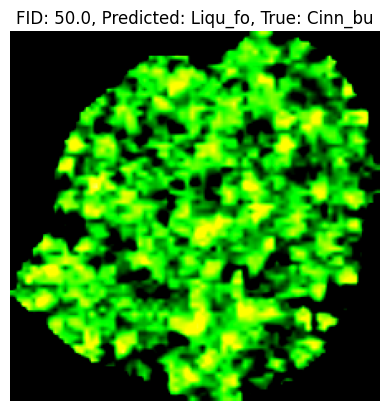

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


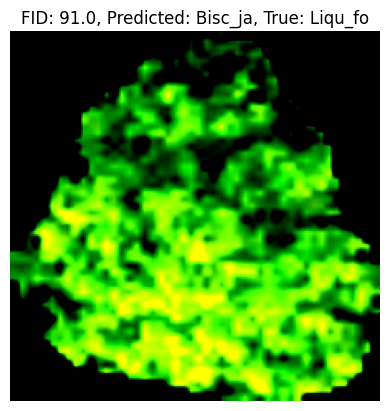

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


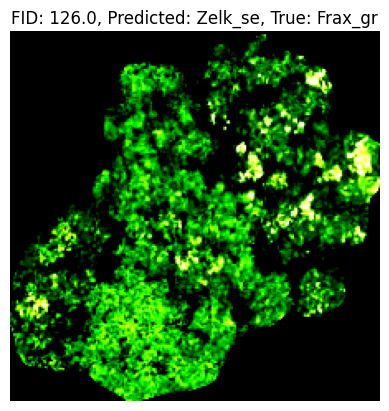

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


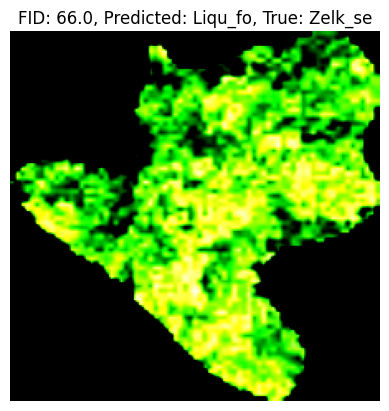

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


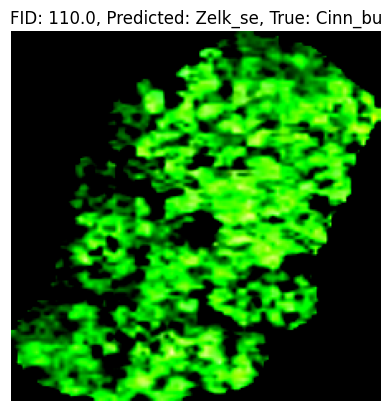

In [33]:
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as T
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from PIL import Image

# Custom dataset class
class PatchDataset(Dataset):
    def __init__(self, patches_and_labels, transform=None):
        self.patches_and_labels = patches_and_labels
        self.transform = transform

    def __len__(self):
        return len(self.patches_and_labels)

    def __getitem__(self, idx):
        patch, label, fid = self.patches_and_labels[idx]

        if self.transform:
            patch = self.transform(patch)

        return patch, label, fid  # Return fid as well

# Load the patches_and_labels from the saved pickle file
with open('h:\\Yehmh\\DNDF\\202404_DNDF\\pickles\\transects_seg_species6_patches_and_labels_3.pkl', 'rb') as f:
    patches_and_labels = pickle.load(f)

# Encode labels
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform([label for _, label, _ in patches_and_labels])
encoded_patches_and_labels = [(patch, encoded_label, fid) for (patch, _, fid), encoded_label in zip(patches_and_labels, encoded_labels)]

# Split the data into training and test sets
train_data, test_data = train_test_split(encoded_patches_and_labels, test_size=0.2, random_state=42)

# Define transformations for training and testing datasets
train_transform = T.Compose([
    T.Lambda(lambda x: Image.fromarray(x)),  # Convert NumPy array to PIL Image
    T.Resize((224, 224)),  # Ensure the image is at least 224x224
    T.RandomHorizontalFlip(),  # Randomly flip the images horizontally
    T.RandomRotation(degrees=15),  # Randomly rotate the images by up to 15 degrees
    T.RandomCrop(size=(224, 224)),  # Randomly crop a 224x224 region of the image
    T.ToTensor(),  # Convert image to PyTorch tensor
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize image data
])

test_transform = T.Compose([
    T.Lambda(lambda x: Image.fromarray(x)),  # Convert NumPy array to PIL Image
    T.Resize((224, 224)),  # Ensure the image is 224x224
    T.ToTensor(),  # Convert image to PyTorch tensor
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize image data
])

# Create the training and test datasets
train_dataset = PatchDataset(train_data, transform=train_transform)
test_dataset = PatchDataset(test_data, transform=test_transform)

# Create DataLoaders for training and test datasets
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# Load pre-trained ResNet-50 model
model = models.resnet50(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(label_encoder.classes_))  # Modify the final layer to match the number of classes
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for patches, labels, _ in train_loader:
        patches = patches.to(device)
        labels = labels.to(device)  # Use already encoded labels

        optimizer.zero_grad()
        outputs = model(patches)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}')

# Save the trained model
torch.save(model.state_dict(), 'resnet50_model.pth')

# Evaluate the model on the test set and plot confusion matrix
model.eval()
all_preds = []
all_labels = []
all_fids = []
wrong_predictions = []

with torch.no_grad():
    for patches, labels, fids in test_loader:
        patches = patches.to(device)
        labels = labels.to(device)
        outputs = model(patches)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_fids.extend(fids)  # Collect FIDs

        # Store wrong predictions along with FID
        for i in range(len(preds)):
            if preds[i] != labels[i]:
                wrong_predictions.append((patches[i].cpu(), preds[i], labels[i], fids[i]))

# Compute and plot confusion matrix
cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_encoder.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.show()

# Display wrong predictions with their FID
for img, pred, true, fid in wrong_predictions:
    plt.imshow(img.permute(1, 2, 0))  # Change from CHW to HWC format for display
    plt.title(f'FID: {fid}, Predicted: {label_encoder.classes_[pred]}, True: {label_encoder.classes_[true]}')
    plt.axis('off')
    plt.show()


c:\Users\user\.conda\envs\RS\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\user\.conda\envs\RS\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/100], Loss: 1.7966
Epoch [2/100], Loss: 1.4678
Epoch [3/100], Loss: 1.3717
Epoch [4/100], Loss: 1.2653
Epoch [5/100], Loss: 1.2693
Epoch [6/100], Loss: 1.2813
Epoch [7/100], Loss: 1.2702
Epoch [8/100], Loss: 1.1816
Epoch [9/100], Loss: 1.2459
Epoch [10/100], Loss: 1.1560
Epoch [11/100], Loss: 1.2511
Epoch [12/100], Loss: 1.1620
Epoch [13/100], Loss: 1.1414
Epoch [14/100], Loss: 1.1195
Epoch [15/100], Loss: 1.1088
Epoch [16/100], Loss: 1.0718
Epoch [17/100], Loss: 1.0390
Epoch [18/100], Loss: 1.1255
Epoch [19/100], Loss: 1.0083
Epoch [20/100], Loss: 1.0196
Epoch [21/100], Loss: 1.0699
Epoch [22/100], Loss: 0.9793
Epoch [23/100], Loss: 0.9530
Epoch [24/100], Loss: 1.0498
Epoch [25/100], Loss: 0.9990
Epoch [26/100], Loss: 0.9434
Epoch [27/100], Loss: 0.9214
Epoch [28/100], Loss: 0.9296
Epoch [29/100], Loss: 0.9354
Epoch [30/100], Loss: 0.8839
Epoch [31/100], Loss: 0.8900
Epoch [32/100], Loss: 0.8639
Epoch [33/100], Loss: 0.8015
Epoch [34/100], Loss: 0.7827
Epoch [35/100], Loss: 0

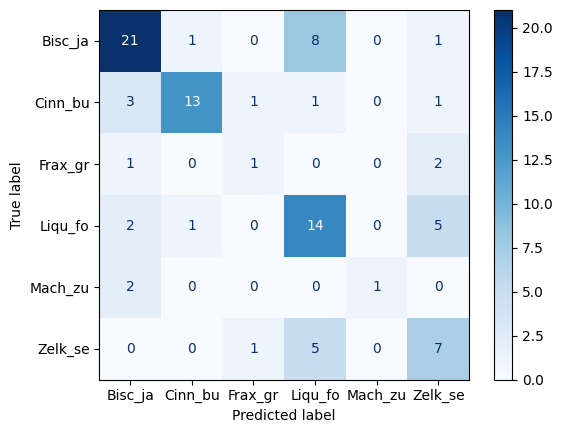

In [30]:
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as T
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from torchvision import models

# Custom dataset class
class PatchDataset(Dataset):
    def __init__(self, patches_and_labels, transform=None):
        self.patches_and_labels = patches_and_labels
        self.transform = transform

    def __len__(self):
        return len(self.patches_and_labels)

    def __getitem__(self, idx):
        patch, label = self.patches_and_labels[idx]

        if self.transform:
            patch = self.transform(patch)

        return patch, label

# Load the patches_and_labels from the saved pickle file
with open('h:\\Yehmh\\DNDF\\202404_DNDF\\pickles\\transects_seg_species6_patches_and_labels_2.pkl', 'rb') as f:
    patches_and_labels = pickle.load(f)

# Extract labels for encoding
labels = [label for _, label in patches_and_labels]

# Fit the LabelEncoder
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(labels)

# Combine patches with encoded labels
encoded_patches_and_labels = [(patch, encoded_label) for (patch, _), encoded_label in zip(patches_and_labels, encoded_labels)]

# Split the data into training and test sets
train_data, test_data = train_test_split(encoded_patches_and_labels, test_size=0.2, random_state=42)

# Define the transformations for training and testing datasets
train_transform = T.Compose([
    T.Lambda(lambda x: Image.fromarray(x)),  # Convert NumPy array to PIL Image
    T.Resize((224, 224)),  # Ensure the image is at least 224x224
    T.RandomHorizontalFlip(),  # Randomly flip the images horizontally
    T.RandomRotation(degrees=15),  # Randomly rotate the images by up to 15 degrees
    T.RandomCrop(size=(224, 224)),  # Randomly crop a 224x224 region of the image
    T.ToTensor(),  # Convert image to PyTorch tensor
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize image data
])

test_transform = T.Compose([
    T.Lambda(lambda x: Image.fromarray(x)),  # Convert NumPy array to PIL Image
    T.Resize((224, 224)),  # Ensure the image is 224x224
    T.ToTensor(),  # Convert image to PyTorch tensor
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize image data
])

# Create the training and test datasets
train_dataset = PatchDataset(train_data, transform=train_transform)
test_dataset = PatchDataset(test_data, transform=test_transform)

# Create DataLoaders for training and test datasets
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# Load pre-trained ResNet-50 model
model = models.resnet50(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(label_encoder.classes_))  # Modify the final layer to match the number of classes
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 100
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for patches, labels in train_loader:
        patches = patches.to(device)
        labels = labels.to(device)  # Use already encoded labels

        optimizer.zero_grad()
        outputs = model(patches)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}')

# Save the trained model
# torch.save(model.state_dict(), 'resnet50_model.pth')

# Evaluate the model on the test set and plot confusion matrix
model.eval()
all_preds = []
all_labels = []
with torch.no_grad():
    for patches, labels in test_loader:
        patches = patches.to(device)
        outputs = model(patches)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Compute and plot confusion matrix
cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_encoder.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Accuracy: 61.96%
Number of wrong predictions: 35


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


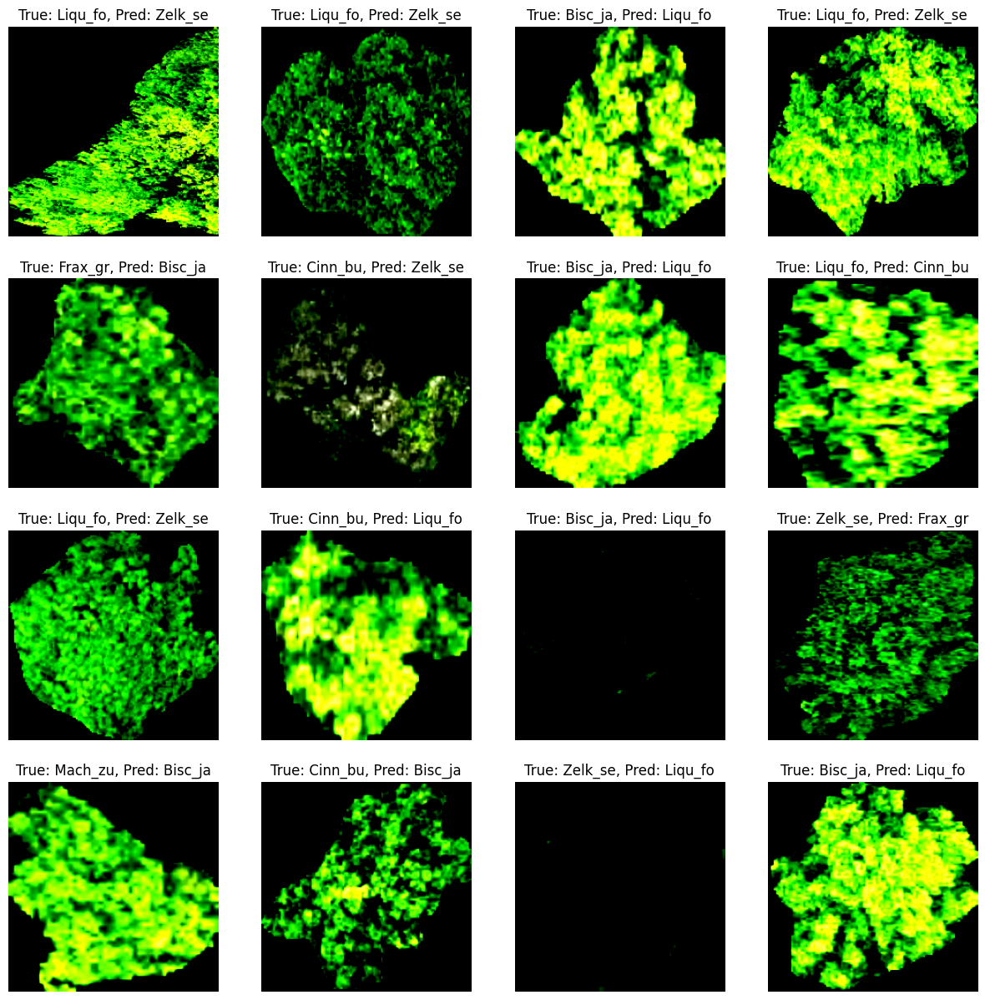

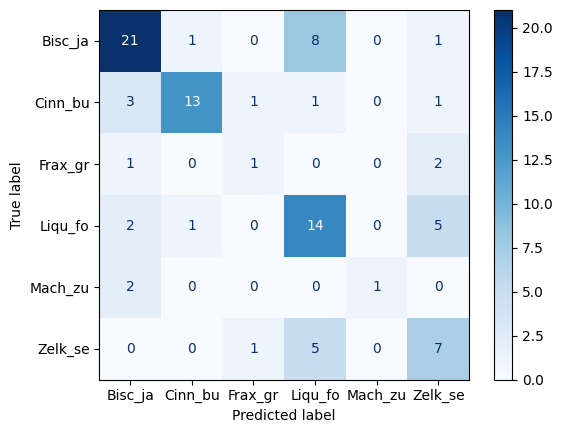

In [31]:
# Evaluate the model on the test set and calculate accuracy
model.eval()
all_preds = []
all_labels = []
wrong_images = []
wrong_labels = []
wrong_preds = []
with torch.no_grad():
    for patches, labels in test_loader:
        patches = patches.to(device)
        outputs = model(patches)
        _, preds = torch.max(outputs, 1)
        
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

        # Collect wrong predictions
        for i in range(len(labels)):
            if preds[i] != labels[i]:
                wrong_images.append(patches[i].cpu())
                wrong_labels.append(labels[i].cpu())
                wrong_preds.append(preds[i].cpu())

# Calculate accuracy
accuracy = np.sum(np.array(all_preds) == np.array(all_labels)) / len(all_labels)
print(f'Accuracy: {accuracy * 100:.2f}%')

# Visualize wrong predictions
num_wrong_images = len(wrong_images)
print(f'Number of wrong predictions: {num_wrong_images}')
if num_wrong_images > 0:
    plt.figure(figsize=(15, 15))
    for i in range(min(num_wrong_images, 16)):  # Display a maximum of 16 wrong predictions
        plt.subplot(4, 4, i + 1)
        plt.imshow(wrong_images[i].permute(1, 2, 0))  # Convert from CxHxW to HxWxC
        plt.title(f'True: {label_encoder.inverse_transform([wrong_labels[i].item()])[0]}, Pred: {label_encoder.inverse_transform([wrong_preds[i].item()])[0]}')
        plt.axis('off')
    plt.show()

# Compute and plot confusion matrix
cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_encoder.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.show()

Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to C:\Users\user/.cache\torch\hub\v0.10.0.zip
c:\Users\user\.conda\envs\RS\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\user\.conda\envs\RS\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/10], Loss: 1.8355
Epoch [2/10], Loss: 1.6040
Epoch [3/10], Loss: 1.4705
Epoch [4/10], Loss: 1.3826
Epoch [5/10], Loss: 1.4040
Epoch [6/10], Loss: 1.3223
Epoch [7/10], Loss: 1.2697
Epoch [8/10], Loss: 1.3315
Epoch [9/10], Loss: 1.2255
Epoch [10/10], Loss: 1.2442


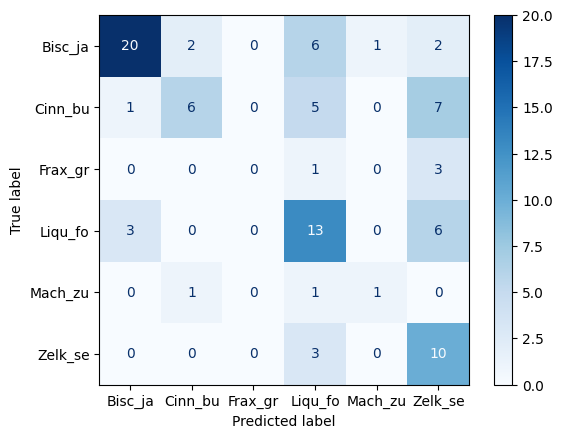

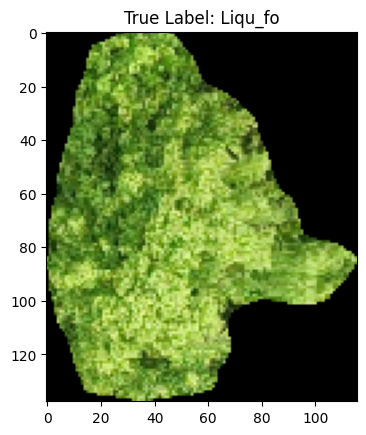

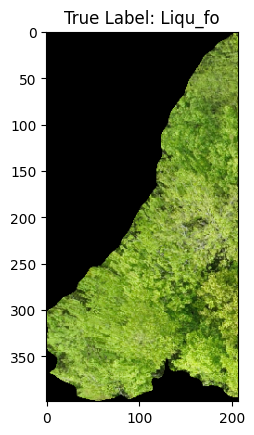

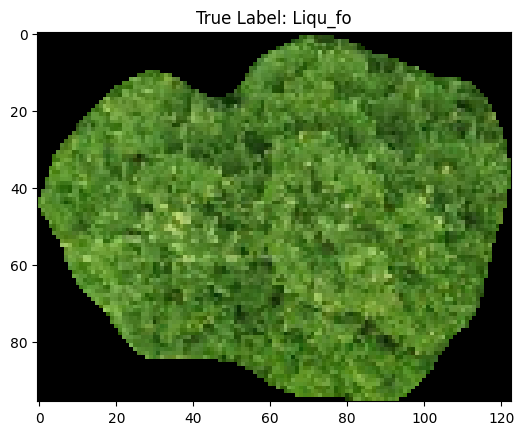

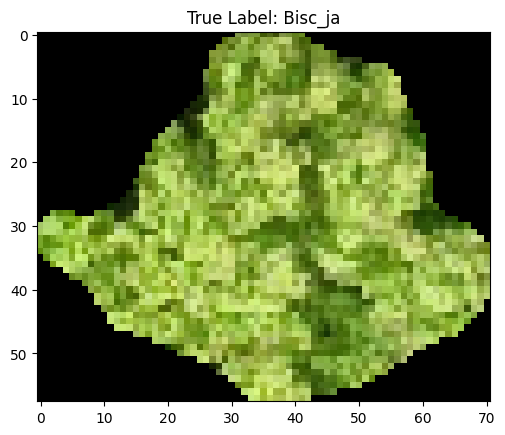

...

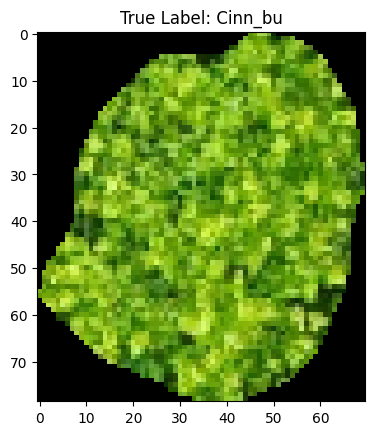

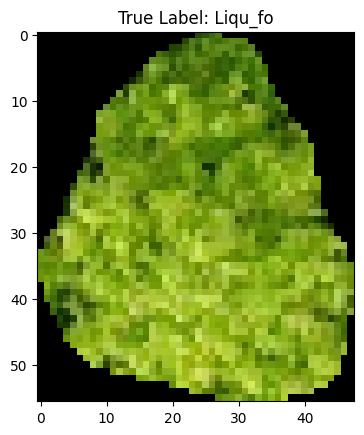

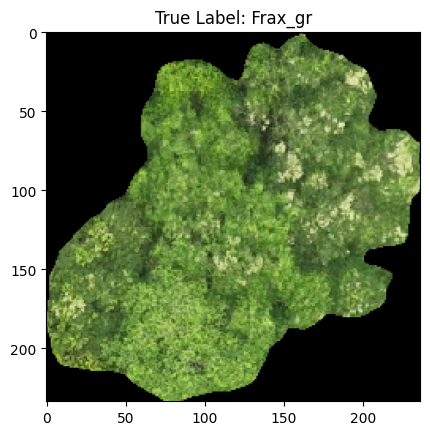

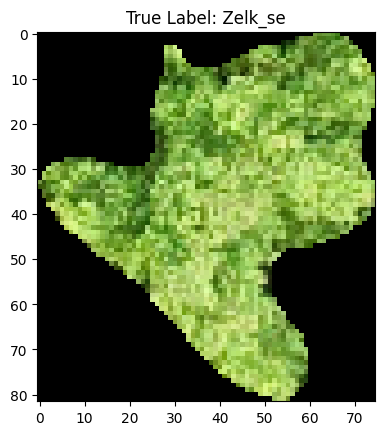

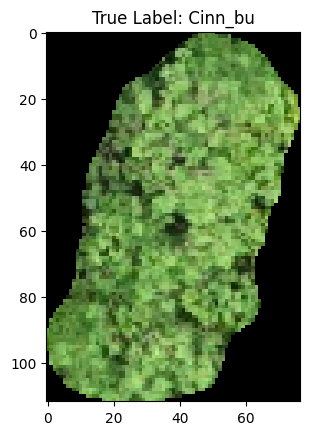

Accuracy: 0.5435


In [29]:
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as T
import torchvision.transforms.functional as TF
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from PIL import Image

# Custom dataset class
class PatchDataset(Dataset):
    def __init__(self, patches_and_labels, transform=None):
        self.patches_and_labels = patches_and_labels
        self.transform = transform

    def __len__(self):
        return len(self.patches_and_labels)

    def __getitem__(self, idx):
        patch, label, id_ = self.patches_and_labels[idx]

        if self.transform:
            patch = self.transform(patch)

        return patch, label, id_

# Load the patches_and_labels from the saved pickle file
with open('h:\\Yehmh\\DNDF\\202404_DNDF\\pickles\\transects_seg_species6_patches_and_labels_2.pkl', 'rb') as f:
    patches_and_labels = pickle.load(f)

# Add an ID to each patch
patches_and_labels = [(patch, label, idx) for idx, (patch, label) in enumerate(patches_and_labels)]

# Encode labels
label_encoder = LabelEncoder()
all_labels = [label for _, label, _ in patches_and_labels]
encoded_labels = label_encoder.fit_transform(all_labels)
patches_and_labels = [(patch, encoded_label, id_) for (patch, _, id_), encoded_label in zip(patches_and_labels, encoded_labels)]

# Split the data into training and test sets
train_data, test_data = train_test_split(patches_and_labels, test_size=0.2, random_state=42)

# Define the transformations for training and testing datasets
train_transform = T.Compose([
    T.Lambda(lambda x: Image.fromarray(x)),  # Convert NumPy array to PIL Image
    T.Resize((224, 224)),  # Ensure the image is at least 224x224
    T.RandomHorizontalFlip(),  # Randomly flip the images horizontally
    T.RandomRotation(degrees=15),  # Randomly rotate the images by up to 15 degrees
    T.RandomCrop(size=(224, 224)),  # Randomly crop a 224x224 region of the image
    T.ToTensor(),  # Convert image to PyTorch tensor
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize image data
])

test_transform = T.Compose([
    T.Lambda(lambda x: Image.fromarray(x)),  # Convert NumPy array to PIL Image
    T.Resize((224, 224)),  # Ensure the image is 224x224
    T.ToTensor(),  # Convert image to PyTorch tensor
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize image data
])

# Create the training and test datasets
train_dataset = PatchDataset(train_data, transform=train_transform)
test_dataset = PatchDataset(test_data, transform=test_transform)

# Create DataLoaders for training and test datasets
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# Load pre-trained ResNet-50 model
model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet50', pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, len(label_encoder.classes_))  # Modify the final layer to match the number of classes
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for patches, labels, ids in train_loader:
        patches = patches.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(patches)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}')

# Save the trained model
# torch.save(model.state_dict(), 'resnet50_model.pth')

# Evaluate the model on the test set and collect incorrect predictions
model.eval()
all_preds = []
all_labels = []
incorrect_ids = []
with torch.no_grad():
    for patches, labels, ids in test_loader:
        patches = patches.to(device)
        labels = labels.to(device)
        outputs = model(patches)
        _, preds = torch.max(outputs, 1)
        
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

        # Collect incorrect predictions
        incorrect_ids.extend([id_ for id_, pred, label in zip(ids, preds, labels) if pred != label])

# Compute and plot confusion matrix
cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_encoder.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.show()

# Display incorrect predictions
for id_ in incorrect_ids:
    patch, label, _ = patches_and_labels[id_]
    plt.imshow(patch)
    plt.title(f"True Label: {label_encoder.inverse_transform([label])[0]}")
    plt.show()

# Calculate accuracy
accuracy = sum([pred == label for pred, label in zip(all_preds, all_labels)]) / len(all_preds)
print(f"Accuracy: {accuracy:.4f}")


In [25]:
# Save the model
torch.save(model.state_dict(), 'h:\\Yehmh\\_model\\0812_DNDF_202404_6species_resnet50_classifier_59.pth')

print("Model saved as resnet50_classifier.pth")

Model saved as resnet50_classifier.pth
